<h1>MinMaxScaler</h1>

In [187]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

np.random.seed(40)

In [188]:
data = pd.read_csv("../data/our_data.csv")
prep_data = pd.read_csv("../data/our_data_preprocessed_MinMaxScaler.csv")

<h1>Finding optimal number of clusters<h1>

<h3>1.Using elbow method<h3>

In [189]:
def count_wcss_scores(X, k_max):
    #  WCSS = within-cluster sum of squares
    scores = []
    for k in range(1, k_max+1):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X)
        wcss = kmeans.score(X) * -1 # score returns -WCSS
        scores.append(wcss)
    return scores

<h3>2. Using silhouette score<h3>

In [190]:
def count_silhouette_scores(X, k_max):
    scores = []
    for k in range(2, k_max + 1):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X)
        labels = kmeans.labels_
        score = silhouette_score(X, labels)
        scores.append(score)
    return scores


<h3>3. Using Calinski-Harabasz score<h3>

In [191]:
def count_calinski_harabasz_scores(X, k_max):
    scores = []
    for k in range(2, k_max + 1):  # Calinski-Harabasz score nie działa dla k=1
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X)
        labels = kmeans.labels_
        score = calinski_harabasz_score(X, labels)
        scores.append(score)
    return scores


<h3>4. Using Davies - Bouldin score<h3>

In [192]:
def count_davies_bouldin_scores(X, k_max):
    scores = []
    for k in range(2, k_max + 1):  # Davies-Bouldin score nie działa dla k=1
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X)
        labels = kmeans.labels_
        score = davies_bouldin_score(X, labels)
        scores.append(score)
    return scores

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/katebokha

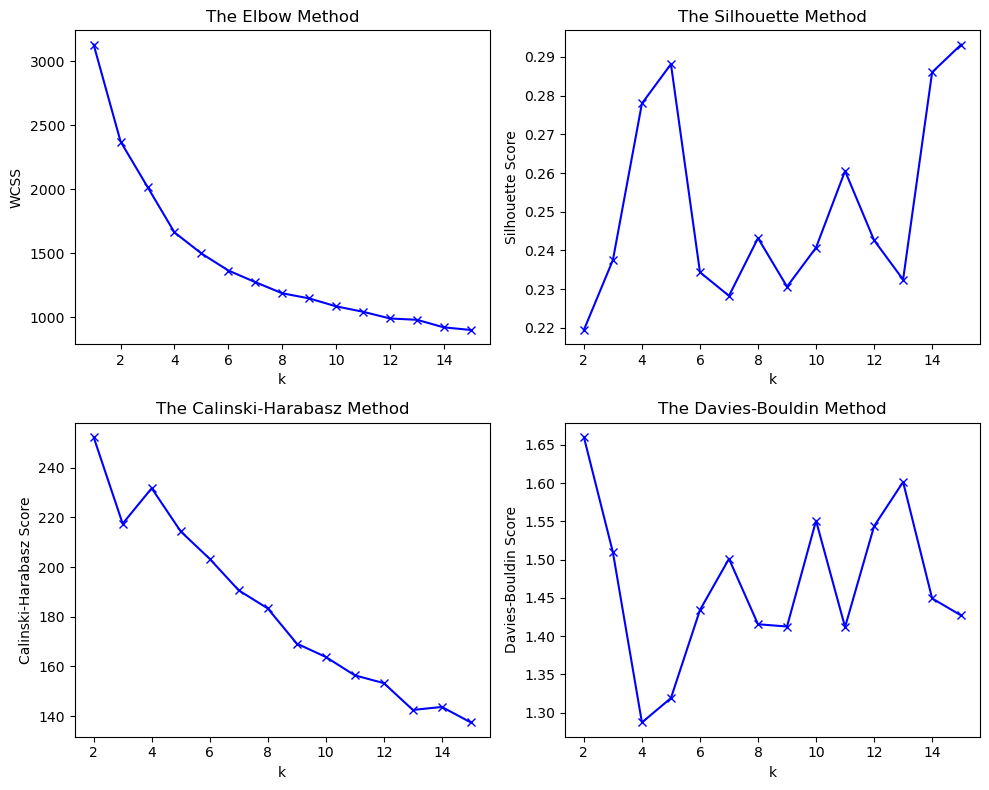

In [193]:
k_max = 15
wcss_vec = count_wcss_scores(prep_data, k_max)
silhouette_vec = count_silhouette_scores(prep_data, k_max)
calinski_harabasz_vec = count_calinski_harabasz_scores(prep_data, k_max)
davies_bouldin_vec = count_davies_bouldin_scores(prep_data, k_max)

x_ticks_wcss = list(range(1, len(wcss_vec) + 1))
x_ticks_silhouette = list(range(2, len(silhouette_vec) + 2))
x_ticks_calinski_harabasz = list(range(2, len(calinski_harabasz_vec) + 2))
x_ticks_davies_bouldin = list(range(2, len(davies_bouldin_vec) + 2))

fig, axs = plt.subplots(2, 2, figsize=(10, 8))

#wcss
axs[0, 0].plot(x_ticks_wcss, wcss_vec, 'bx-')
axs[0, 0].set_xlabel('k')
axs[0, 0].set_ylabel('WCSS')
axs[0, 0].set_title('The Elbow Method')

#silhouette
axs[0, 1].plot(x_ticks_silhouette, silhouette_vec, 'bx-')
axs[0, 1].set_xlabel('k')
axs[0, 1].set_ylabel('Silhouette Score')
axs[0, 1].set_title('The Silhouette Method')

#Calinski-Harabasz
axs[1, 0].plot(x_ticks_calinski_harabasz, calinski_harabasz_vec, 'bx-')
axs[1, 0].set_xlabel('k')
axs[1, 0].set_ylabel('Calinski-Harabasz Score')
axs[1, 0].set_title('The Calinski-Harabasz Method')

#Davies-Bouldin
axs[1, 1].plot(x_ticks_davies_bouldin, davies_bouldin_vec, 'bx-')
axs[1, 1].set_xlabel('k')
axs[1, 1].set_ylabel('Davies-Bouldin Score')
axs[1, 1].set_title('The Davies-Bouldin Method')

plt.tight_layout()
plt.show()

Based on the above plots, we choose k = 4 and k = 8 for clustering with KMeans.

<h1 style="color: #FF8C00 " ; font-size: 36px;">Clustering with KMeans (all columns where used for clustering )</h1>



In [194]:
kmeans_k4 = KMeans(n_clusters=4, random_state=40)
data['Cluster_k4'] = kmeans_k4.fit_predict(prep_data)


kmeans_k8 = KMeans(n_clusters=8, random_state=40)
data['Cluster_k8'] = kmeans_k8.fit_predict(prep_data)

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [195]:
def show_scores(data, cluster_col):
    print(cluster_col)
    print("Silhouette Score: ", silhouette_score(data, data[cluster_col]))
    print("Calinski-Harabasz Score: ", calinski_harabasz_score(data, data[cluster_col]))
    print("Davies-Bouldin Score: ", davies_bouldin_score(data, data[cluster_col]))

In [196]:
prep_data['Cluster_k4'] = data['Cluster_k4']
prep_data['Cluster_k8'] = data['Cluster_k8']

In [197]:
show_scores(prep_data.drop(['Cluster_k8'], axis=1), 'Cluster_k4')

Cluster_k4
Silhouette Score:  0.34510110602601984
Calinski-Harabasz Score:  314.2308233832963
Davies-Bouldin Score:  1.1088921206093034


In [198]:
show_scores(prep_data.drop(['Cluster_k4'], axis=1), 'Cluster_k8')

Cluster_k8
Silhouette Score:  0.4358251269959482
Calinski-Harabasz Score:  516.9414118523637
Davies-Bouldin Score:  0.8557167386310334


<h1>PCA<h1>

[0.39443188 0.54242377 0.65237494 0.70687949 0.76097967 0.79683632
 0.8288938  0.85577207 0.87909895 0.90021189 0.91777799 0.93301178
 0.94561858 0.95365809 0.95888898 0.96377151 0.96836301 0.97178426
 0.97506135 0.97792731 0.98077822 0.98292046 0.98490684 0.98655415
 0.98799264 0.98922606 0.99041371 0.99151377 0.99245154 0.99324835]


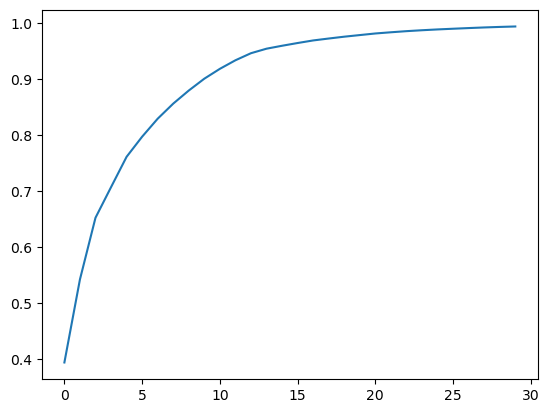

In [199]:
pca = PCA(n_components=30)
pca.fit(prep_data.drop(['Cluster_k4', 'Cluster_k8'], axis=1))

plt.plot(np.cumsum(pca.explained_variance_ratio_))

print(np.cumsum(pca.explained_variance_ratio_))

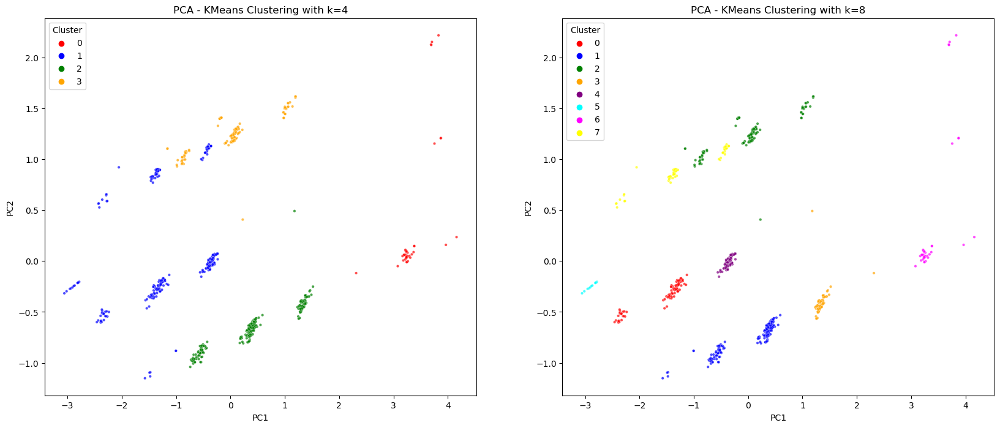

In [200]:
pca = PCA(n_components=2)
principal_components_k4 = pca.fit_transform(prep_data.drop(['Cluster_k8', 'Cluster_k4'], axis=1))
principal_components_k8 = pca.fit_transform(prep_data.drop(['Cluster_k8', 'Cluster_k4'], axis=1))

df_pca_k4 = pd.DataFrame(data=principal_components_k4, columns=['PC1', 'PC2'])
df_pca_k4['Cluster'] = data['Cluster_k4']

df_pca_k8 = pd.DataFrame(data=principal_components_k8, columns=['PC1', 'PC2'])
df_pca_k8['Cluster'] = data['Cluster_k8']

colors = {
    0: "red",
    1: "blue",
    2: "green",
    3: "orange",
    4: "purple",
    5: "cyan",
    6: "magenta",
    7: "yellow",
    8: "brown",
    9: "black"
}

fig, ax = plt.subplots(1, 2, figsize=(20, 8))

sns.scatterplot(x='PC1', y='PC2', hue='Cluster', palette=colors, data=df_pca_k4, s=10, ax=ax[0], alpha=0.7)
ax[0].set_title('PCA - KMeans Clustering with k=4')

sns.scatterplot(x='PC1', y='PC2', hue='Cluster', palette=colors, data=df_pca_k8, s=10, ax=ax[1], alpha=0.7)
ax[1].set_title('PCA - KMeans Clustering with k=8')

plt.show()

<h1>t-SNE</h1>

<AxesSubplot: xlabel='t-SNE1', ylabel='t-SNE2'>

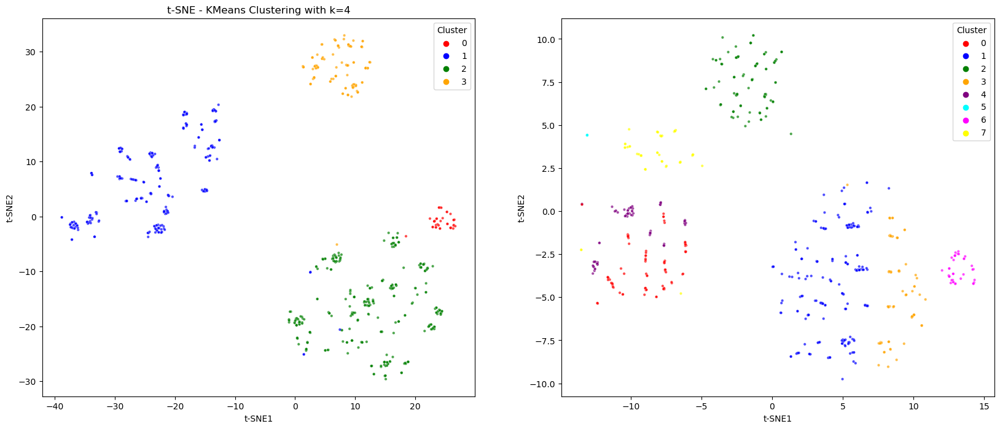

In [201]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=40, learning_rate=300, n_iter=1000, random_state=40)
data_tsne_k4 = tsne.fit_transform(prep_data.drop(['Cluster_k8', 'Cluster_k4'], axis=1))

df_tsne_k4 = pd.DataFrame(data=data_tsne_k4, columns=['t-SNE1', 't-SNE2'])
df_tsne_k4['Cluster'] = data['Cluster_k4']

fig, ax = plt.subplots(1, 2, figsize=(20, 8))

sns.scatterplot(x='t-SNE1', y='t-SNE2', hue='Cluster', palette=colors, data=df_tsne_k4, s=10, ax=ax[0], alpha=0.7)
ax[0].set_title('t-SNE - KMeans Clustering with k=4')

###########################

tsne = TSNE(n_components=2, perplexity=150, learning_rate=300, n_iter=1000, random_state=40)
data_tsne_k8 = tsne.fit_transform(prep_data.drop(['Cluster_k8', 'Cluster_k4'], axis=1))

df_tsne_k8 = pd.DataFrame(data=data_tsne_k8, columns=['t-SNE1', 't-SNE2'])
df_tsne_k8['Cluster'] = data['Cluster_k8']

sns.scatterplot(x='t-SNE1', y='t-SNE2', hue='Cluster', palette=colors, data=df_tsne_k8, s=10, ax=ax[1], alpha=0.7)


<h1>Kernel PCA</h1>

Text(0.5, 1.0, 'KPCA - KMeans Clustering with k=8')

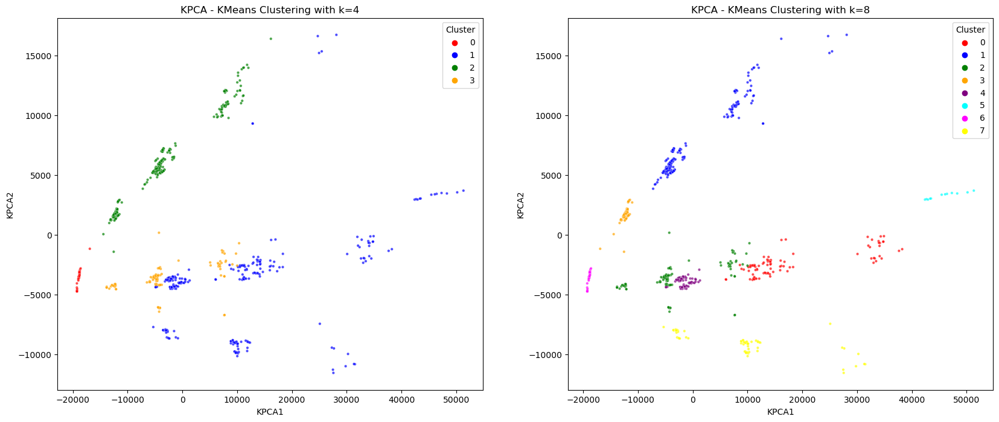

In [202]:
from sklearn.decomposition import KernelPCA

kpca = KernelPCA(n_components=2, kernel='poly', 
                 gamma=30, random_state=49)

data_kpca_k4 = kpca.fit_transform(prep_data.drop(['Cluster_k8', 'Cluster_k4'], axis=1))
data_kpca_k8 = kpca.fit_transform(prep_data.drop(['Cluster_k8', 'Cluster_k4'], axis=1))

df_kpca_k4 = pd.DataFrame(data=data_kpca_k4, columns=['KPCA1', 'KPCA2'])
df_kpca_k4['Cluster'] = data['Cluster_k4']

df_kpca_k8 = pd.DataFrame(data=data_kpca_k8, columns=['KPCA1', 'KPCA2'])
df_kpca_k8['Cluster'] = data['Cluster_k8']

fig, ax = plt.subplots(1, 2, figsize=(20, 8))

sns.scatterplot(x='KPCA1', y='KPCA2', hue='Cluster', palette=colors, data=df_kpca_k4, s=10, ax=ax[0], alpha=0.7)
ax[0].set_title('KPCA - KMeans Clustering with k=4')

sns.scatterplot(x='KPCA1', y='KPCA2', hue='Cluster', palette=colors, data=df_kpca_k8, s=10, ax=ax[1], alpha=0.7)
ax[1].set_title('KPCA - KMeans Clustering with k=8')


<h1> Multidimensional Scaling (MDS) </h1>

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/manifold/_mds.py:298: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/manifold/_mds.py:298: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



Text(0.5, 1.0, 'MDS - KMeans Clustering with k=8')

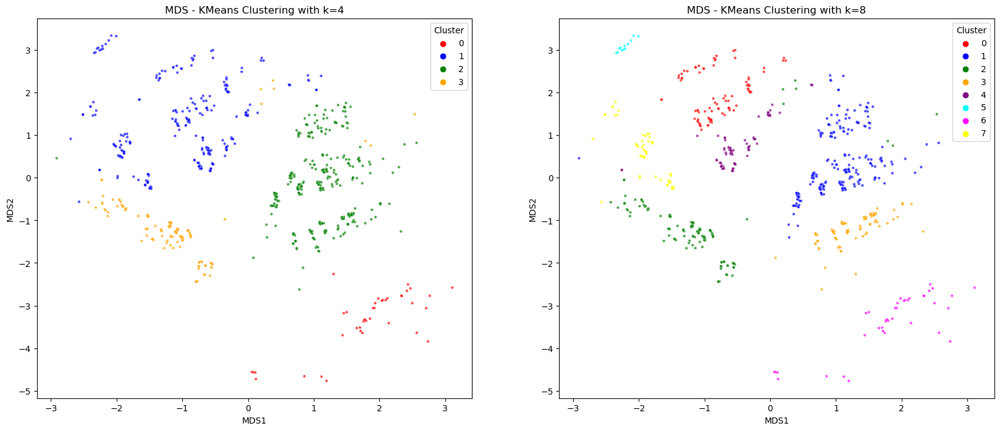

In [203]:
from sklearn.manifold import MDS 

mds = MDS(n_components=2, metric=True, random_state=2)

data_mds_k4 = mds.fit_transform(prep_data.drop(['Cluster_k8', 'Cluster_k4'], axis=1))
data_mds_k8 = mds.fit_transform(prep_data.drop(['Cluster_k8', 'Cluster_k4'], axis=1))

df_mds_k4 = pd.DataFrame(data=data_mds_k4, columns=['MDS1', 'MDS2'])
df_mds_k4['Cluster'] = data['Cluster_k4']

df_mds_k8 = pd.DataFrame(data=data_mds_k8, columns=['MDS1', 'MDS2'])
df_mds_k8['Cluster'] = data['Cluster_k8']

fig, ax = plt.subplots(1, 2, figsize=(20, 8))

sns.scatterplot(x='MDS1', y='MDS2', hue='Cluster', palette=colors, data=df_mds_k4, s=10, ax=ax[0], alpha=0.7)
ax[0].set_title('MDS - KMeans Clustering with k=4')

sns.scatterplot(x='MDS1', y='MDS2', hue='Cluster', palette=colors, data=df_mds_k8, s=10, ax=ax[1], alpha=0.7)
ax[1].set_title('MDS - KMeans Clustering with k=8')

<h1>Umap</h1>

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



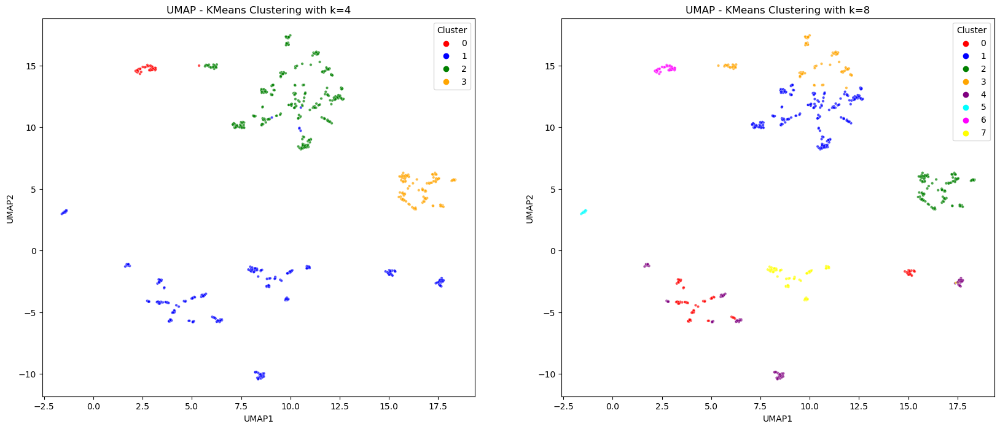

In [204]:
import umap

umap4 = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.8, random_state=42, n_epochs=500)

data_umap_k4 = umap4.fit_transform(prep_data.drop(['Cluster_k4', 'Cluster_k8'], axis=1))

df_umap_k4 = pd.DataFrame(data=data_umap_k4, columns=['UMAP1', 'UMAP2'])
df_umap_k4['Cluster'] = data['Cluster_k4']

fig, ax = plt.subplots(1, 2, figsize=(20, 8))

sns.scatterplot(x='UMAP1', y='UMAP2', hue='Cluster', palette=colors, data=df_umap_k4, s=10, ax=ax[0], alpha=0.7)
ax[0].set_title('UMAP - KMeans Clustering with k=4')

##################################################################################################
umap8 = umap.UMAP(n_components=2, n_neighbors=80, min_dist=0.2, random_state=42, n_epochs=500)

data_umap_k8 = umap8.fit_transform(prep_data.drop(['Cluster_k4', 'Cluster_k8'], axis=1))

df_umap_k8 = pd.DataFrame(data=data_umap_k8, columns=['UMAP1', 'UMAP2'])
df_umap_k8['Cluster'] = data['Cluster_k8']

sns.scatterplot(x='UMAP1', y='UMAP2', hue='Cluster', palette=colors, data=df_umap_k8, s=10, ax=ax[1], alpha=0.7)
ax[1].set_title('UMAP - KMeans Clustering with k=8')

plt.show()


<h1>Isomap</h1>

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/manifold/_isomap.py:383: UserWarning:

The number of connected components of the neighbors graph is 4 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/scip

<AxesSubplot: xlabel='Isomap1', ylabel='Isomap2'>

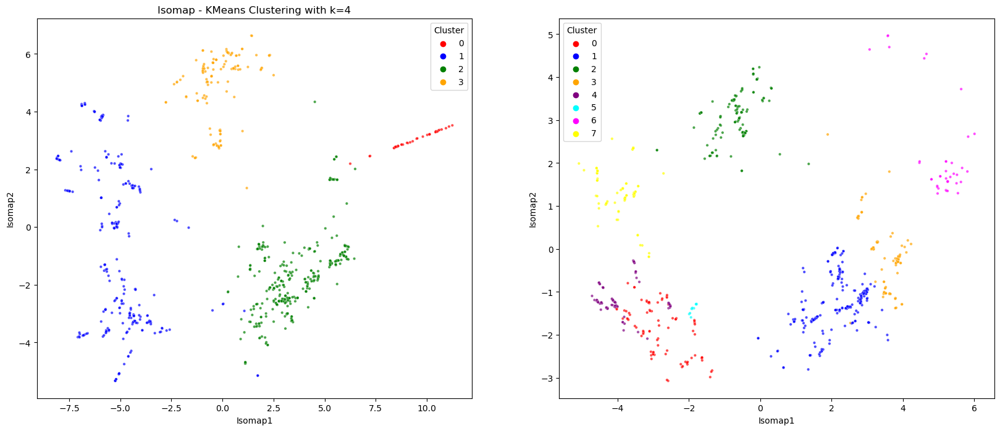

In [205]:
from sklearn.manifold import Isomap

isomap = Isomap(n_components=2, n_neighbors=10)

data_isomap_k4 = isomap.fit_transform(prep_data.drop(['Cluster_k8', 'Cluster_k4'], axis=1))

df_isomap_k4 = pd.DataFrame(data=data_isomap_k4, columns=['Isomap1', 'Isomap2'])
df_isomap_k4['Cluster'] = data['Cluster_k4']

fig, ax = plt.subplots(1, 2, figsize=(20, 8))

sns.scatterplot(x='Isomap1', y='Isomap2', hue='Cluster', palette=colors, data=df_isomap_k4, s=10, ax=ax[0], alpha=0.7)
ax[0].set_title('Isomap - KMeans Clustering with k=4')

##################################################################################################
isomap = Isomap(n_components=2, n_neighbors=40)

data_isomap_k8 = isomap.fit_transform(prep_data.drop(['Cluster_k8', 'Cluster_k4'], axis=1))

df_isomap_k8 = pd.DataFrame(data=data_isomap_k8, columns=['Isomap1', 'Isomap2'])
df_isomap_k8['Cluster'] = data['Cluster_k8']

sns.scatterplot(x='Isomap1', y='Isomap2', hue='Cluster', palette=colors, data=df_isomap_k8, s=10, ax=ax[1], alpha=0.7)

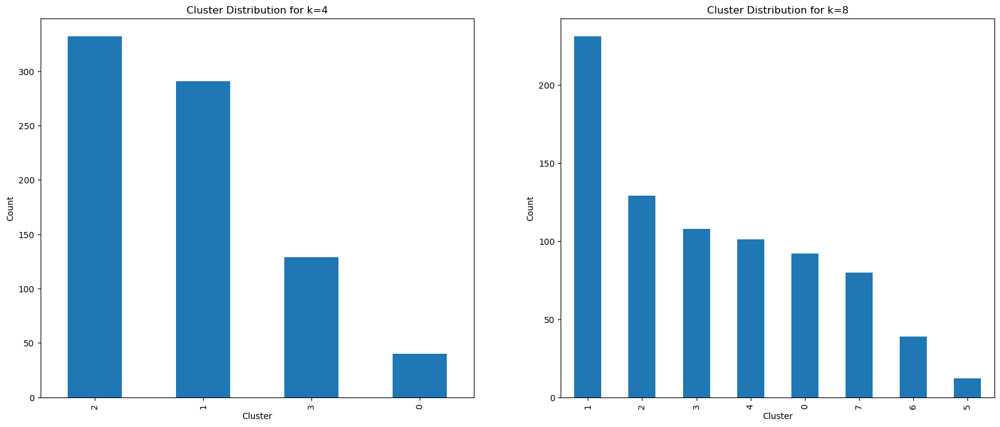

In [206]:
fig, ax = plt.subplots(1, 2, figsize=(20, 8))

data['Cluster_k4'].value_counts().plot(kind='bar', ax=ax[0])
ax[0].set_title('Cluster Distribution for k=4')
ax[0].set_xlabel('Cluster')
ax[0].set_ylabel('Count')

data['Cluster_k8'].value_counts().plot(kind='bar', ax=ax[1])
ax[1].set_title('Cluster Distribution for k=8')
ax[1].set_xlabel('Cluster')
ax[1].set_ylabel('Count')

plt.show()

### Exploration of Clusters (k=4)

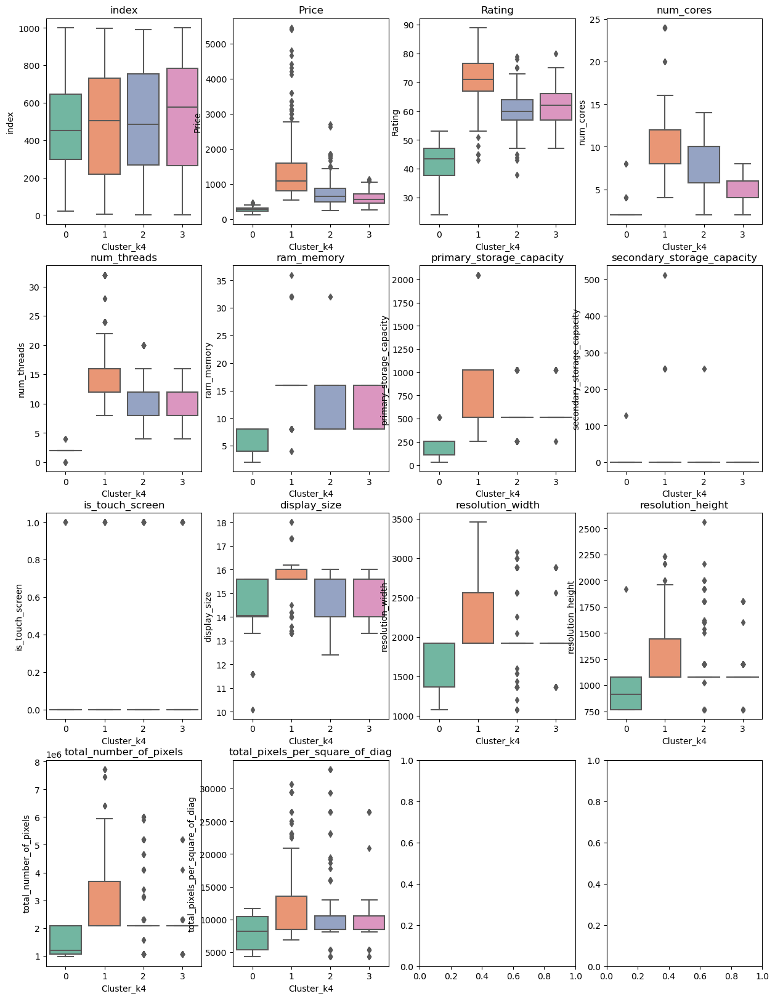

In [207]:
fig, axes = plt.subplots(4, 4, figsize=(15, 4 * 5))

axes = axes.flatten()

i=0
for column in data.columns:
    if column != 'Cluster_k4' and (type(data[column][0]) == np.float64 or type(data[column][0]) == np.int64):
        sns.boxplot(x='Cluster_k4', y=column, data=data, ax = axes[i], palette="Set2")
        axes[i].set_title(column)
        i+=1

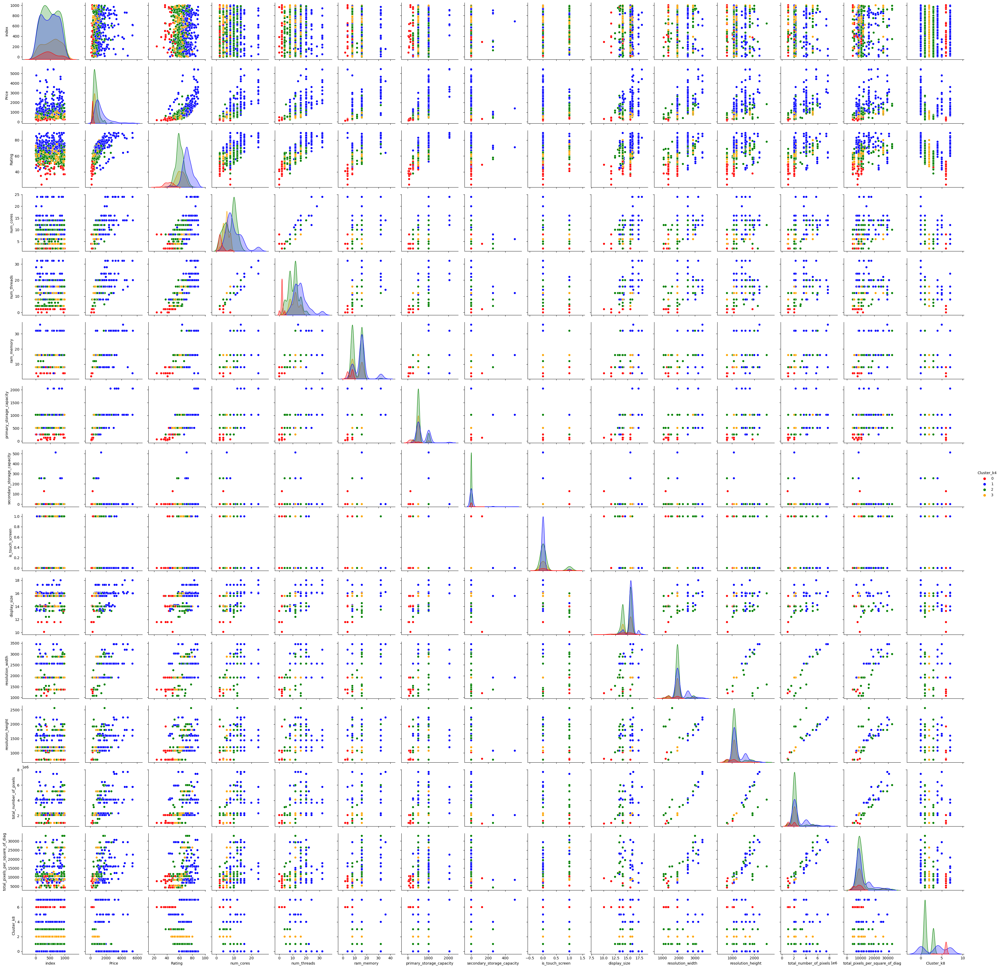

In [208]:
sns.pairplot(data, hue='Cluster_k4', palette=colors)

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/3860854382.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/3860854382.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/3860854382.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/3860854382.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/3860854382.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/3860854382.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd8

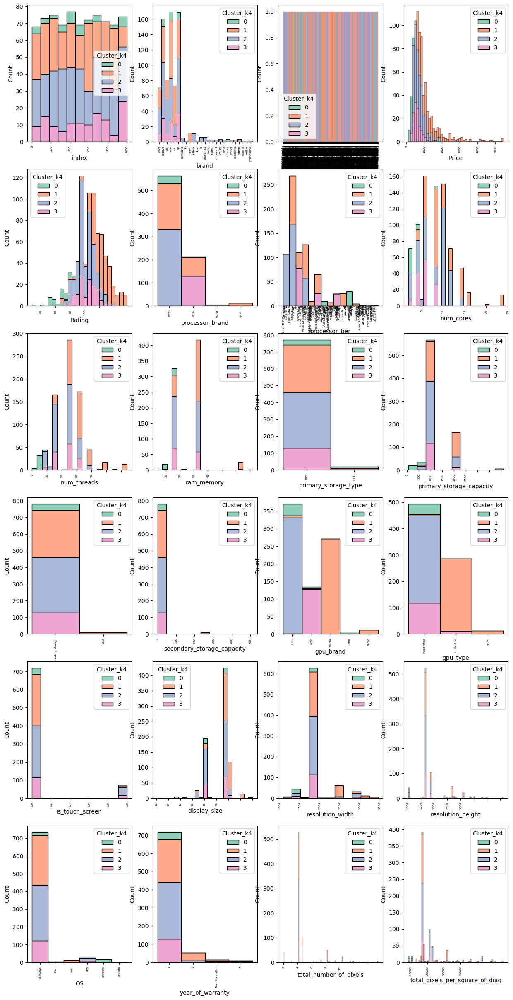

In [209]:
fig, axes = plt.subplots(6, 4, figsize=(15, 6 * 5))

axes = axes.flatten()

i=0

for i, column in enumerate(data.columns):
    if column != 'Cluster_k8' and column != 'Cluster_k4':
        sns.histplot(data=data, x=column, hue="Cluster_k4", multiple="stack", ax=axes[i], palette='Set2')
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
        axes[i].tick_params(axis='x', labelsize=5)
        axes[i].set_xlabel(column)
        i+=1

In [210]:
import plotly.express as px

fig = px.histogram(data, x='brand', color='Cluster_k4')
fig.show()

### Exploration of Clusters (k=8)

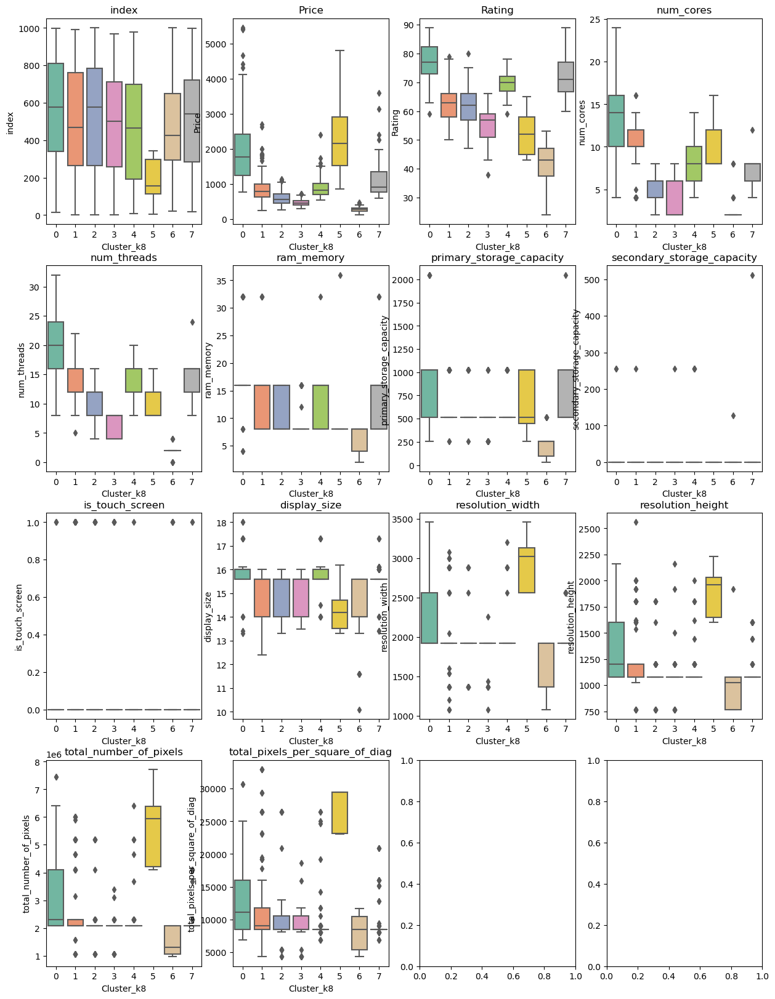

In [211]:
fig, axes = plt.subplots(4, 4, figsize=(15, 4 * 5))

axes = axes.flatten()

i=0
for column in data.columns:
    if column != 'Cluster_k8' and (type(data[column][0]) == np.float64 or type(data[column][0]) == np.int64):
        sns.boxplot(x='Cluster_k8', y=column, data=data, ax = axes[i], palette="Set2")
        axes[i].set_title(column)
        i+=1

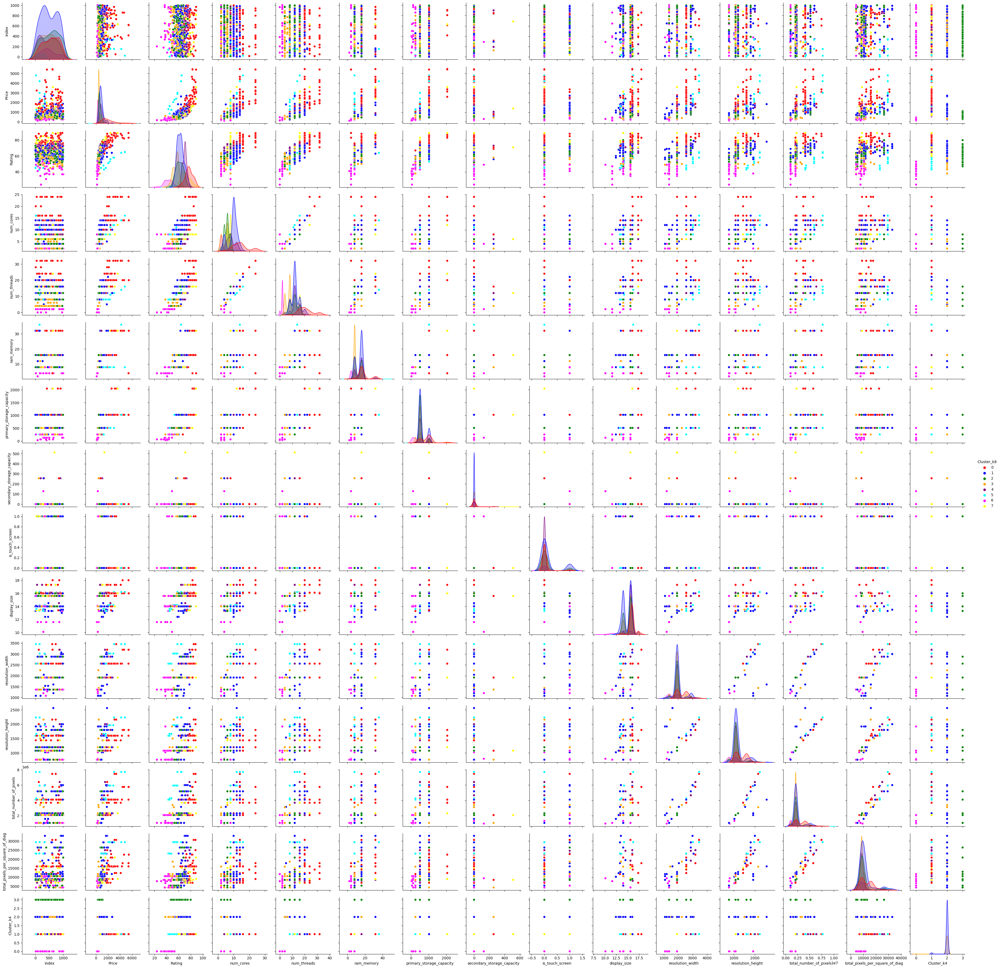

In [212]:
sns.pairplot(data, hue='Cluster_k8', palette=colors)

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/3317267338.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/3317267338.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/3317267338.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/3317267338.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/3317267338.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/3317267338.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd8

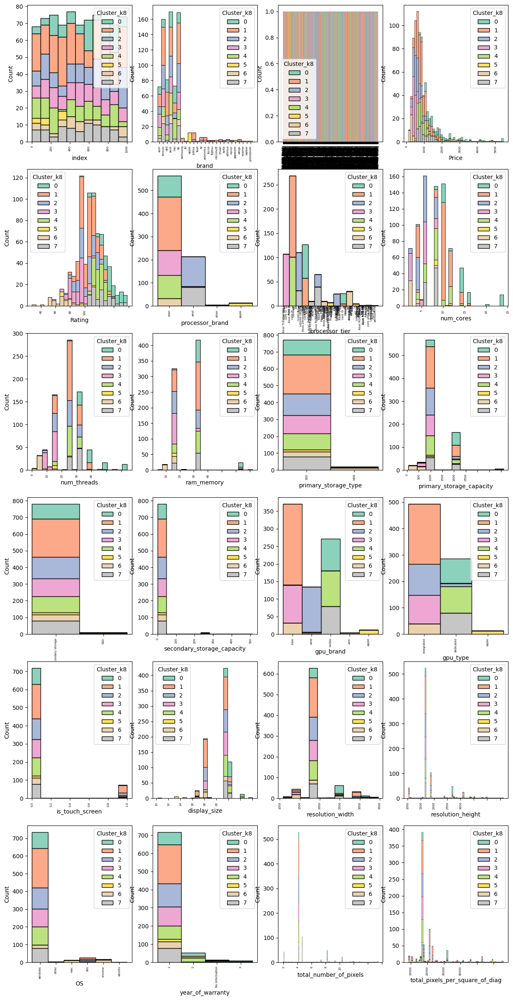

In [213]:
fig, axes = plt.subplots(6, 4, figsize=(15, 6 * 5))

axes = axes.flatten()

i=0

for i, column in enumerate(data.columns):
    if column != 'Cluster_k8' and column != 'Cluster_k4':
        sns.histplot(data=data, x=column, hue="Cluster_k8", multiple="stack", ax=axes[i], palette='Set2')
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
        axes[i].tick_params(axis='x', labelsize=5)
        axes[i].set_xlabel(column)
        i+=1

In [214]:
import plotly.express as px

fig = px.histogram(data, x='brand', color='Cluster_k8')
fig.show()

<h1>StandardScaler</h1>

In [215]:
data = pd.read_csv("../data/our_data.csv")
prep_data = pd.read_csv("../data/our_data_preprocessed_StandardScaler.csv")

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/katebokha

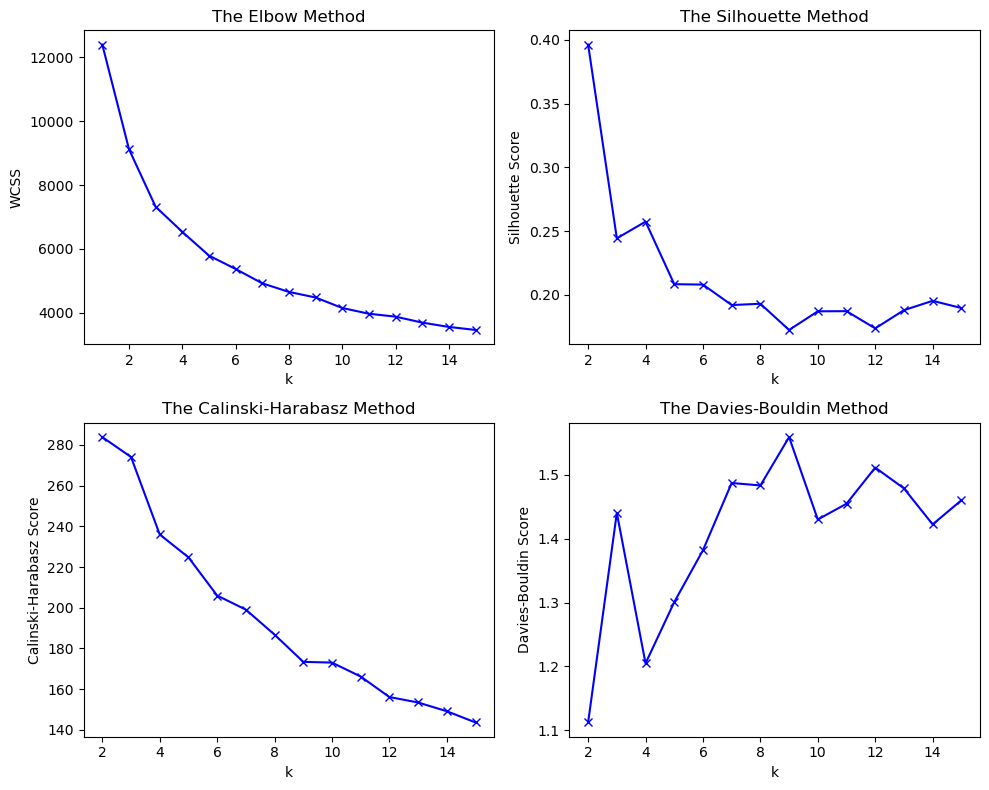

In [216]:
k_max = 15
wcss_vec = count_wcss_scores(prep_data, k_max)
silhouette_vec = count_silhouette_scores(prep_data, k_max)
calinski_harabasz_vec = count_calinski_harabasz_scores(prep_data, k_max)
davies_bouldin_vec = count_davies_bouldin_scores(prep_data, k_max)

x_ticks_wcss = list(range(1, len(wcss_vec) + 1))
x_ticks_silhouette = list(range(2, len(silhouette_vec) + 2))
x_ticks_calinski_harabasz = list(range(2, len(calinski_harabasz_vec) + 2))
x_ticks_davies_bouldin = list(range(2, len(davies_bouldin_vec) + 2))

fig, axs = plt.subplots(2, 2, figsize=(10, 8))

#wcss
axs[0, 0].plot(x_ticks_wcss, wcss_vec, 'bx-')
axs[0, 0].set_xlabel('k')
axs[0, 0].set_ylabel('WCSS')
axs[0, 0].set_title('The Elbow Method')

#silhouette
axs[0, 1].plot(x_ticks_silhouette, silhouette_vec, 'bx-')
axs[0, 1].set_xlabel('k')
axs[0, 1].set_ylabel('Silhouette Score')
axs[0, 1].set_title('The Silhouette Method')

#Calinski-Harabasz
axs[1, 0].plot(x_ticks_calinski_harabasz, calinski_harabasz_vec, 'bx-')
axs[1, 0].set_xlabel('k')
axs[1, 0].set_ylabel('Calinski-Harabasz Score')
axs[1, 0].set_title('The Calinski-Harabasz Method')

#Davies-Bouldin
axs[1, 1].plot(x_ticks_davies_bouldin, davies_bouldin_vec, 'bx-')
axs[1, 1].set_xlabel('k')
axs[1, 1].set_ylabel('Davies-Bouldin Score')
axs[1, 1].set_title('The Davies-Bouldin Method')

plt.tight_layout()
plt.show()

Based on the above plots, we choose k = 2 and k = 4 for clustering with KMeans.

In [217]:
kmeans_k2 = KMeans(n_clusters=2, random_state=40)
data['Cluster_k2'] = kmeans_k2.fit_predict(prep_data)


kmeans_k4 = KMeans(n_clusters=4, random_state=40)
data['Cluster_k4'] = kmeans_k4.fit_predict(prep_data)

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [218]:
prep_data['Cluster_k2'] = data['Cluster_k2']
prep_data['Cluster_k4'] = data['Cluster_k4']

In [219]:
show_scores(prep_data.drop(['Cluster_k4'], axis=1), 'Cluster_k2')

Cluster_k2
Silhouette Score:  0.40262128926805213
Calinski-Harabasz Score:  292.19638511261746
Davies-Bouldin Score:  1.0963675913452757


In [220]:
show_scores(prep_data.drop(['Cluster_k2'], axis=1), 'Cluster_k4')

Cluster_k4
Silhouette Score:  0.2227685026535818
Calinski-Harabasz Score:  253.96892175963927
Davies-Bouldin Score:  1.4387054529142387


<h1>PCA</h1>

[0.46647344 0.60703541 0.67455129 0.73438681 0.77858725 0.81498132
 0.85043904 0.8745931  0.8936489  0.90802578 0.92144256 0.93443705
 0.94573118 0.95563214 0.96343287 0.97099122 0.97607476 0.98025157
 0.98378861 0.98727362 0.99008034 0.99267252 0.99383131 0.99467512
 0.9953325  0.99592763 0.99647002 0.99690584 0.99731914 0.99768255]


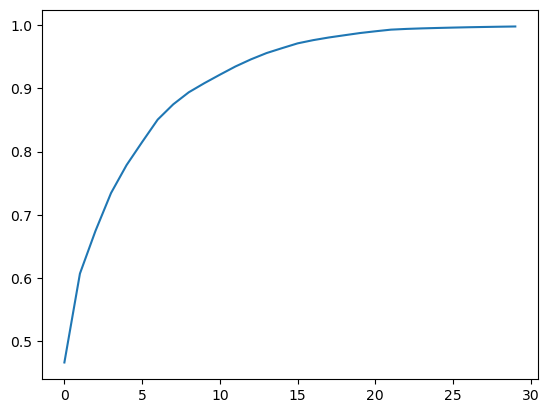

In [221]:
pca = PCA(n_components=30)
pca.fit(prep_data.drop(['Cluster_k2', 'Cluster_k4'], axis=1))

plt.plot(np.cumsum(pca.explained_variance_ratio_))

print(np.cumsum(pca.explained_variance_ratio_))

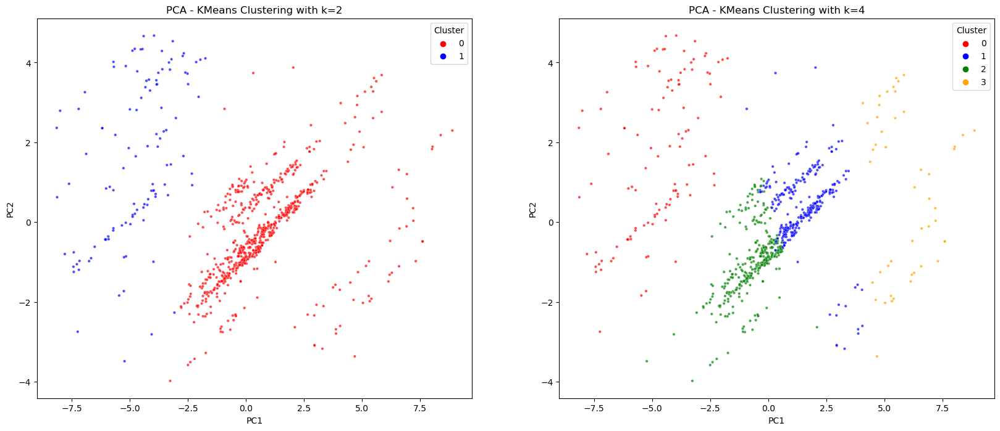

In [222]:
pca = PCA(n_components=2)
principal_components_k2 = pca.fit_transform(prep_data.drop(['Cluster_k4', 'Cluster_k2'], axis=1))
principal_components_k4 = pca.fit_transform(prep_data.drop(['Cluster_k4', 'Cluster_k2'], axis=1))

df_pca_k2 = pd.DataFrame(data=principal_components_k2, columns=['PC1', 'PC2'])
df_pca_k2['Cluster'] = data['Cluster_k2']

df_pca_k4 = pd.DataFrame(data=principal_components_k4, columns=['PC1', 'PC2'])
df_pca_k4['Cluster'] = data['Cluster_k4']

colors = {
    0: "red",
    1: "blue",
    2: "green",
    3: "orange",
    4: "purple",
    5: "cyan",
    6: "magenta",
    7: "yellow",
    8: "brown",
    9: "black"
}

fig, ax = plt.subplots(1, 2, figsize=(20, 8))

sns.scatterplot(x='PC1', y='PC2', hue='Cluster', palette=colors, data=df_pca_k2, s=10, ax=ax[0], alpha=0.7)
ax[0].set_title('PCA - KMeans Clustering with k=2')

sns.scatterplot(x='PC1', y='PC2', hue='Cluster', palette=colors, data=df_pca_k4, s=10, ax=ax[1], alpha=0.7)
ax[1].set_title('PCA - KMeans Clustering with k=4')

plt.show()

<h1> T-SNE</h1>

Text(0.5, 1.0, 't-SNE - KMeans Clustering with k=4')

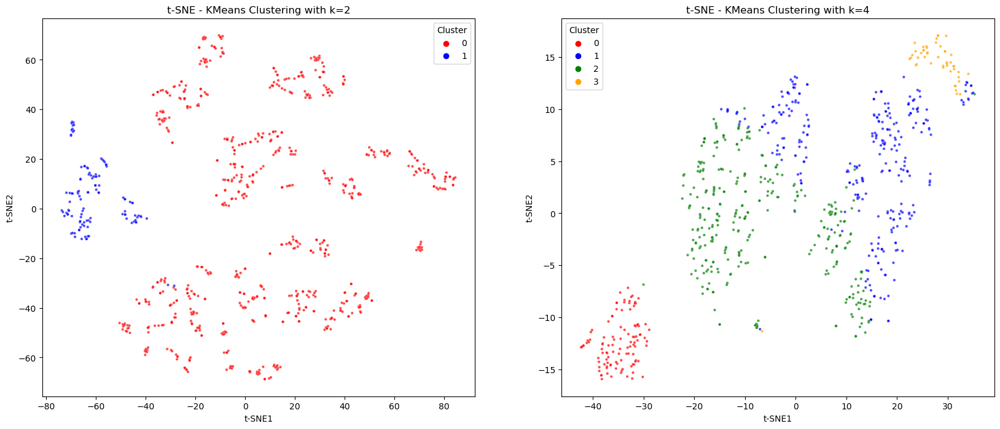

In [223]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=8, learning_rate=200, n_iter=1000, random_state=42)
data_tsne_k2 = tsne.fit_transform(prep_data.drop(['Cluster_k4', 'Cluster_k2'], axis=1))

df_tsne_k2 = pd.DataFrame(data=data_tsne_k2, columns=['t-SNE1', 't-SNE2'])
df_tsne_k2['Cluster'] = data['Cluster_k2']

fig, ax = plt.subplots(1, 2, figsize=(20, 8))

sns.scatterplot(x='t-SNE1', y='t-SNE2', hue='Cluster', palette=colors, data=df_tsne_k2, s=10, ax=ax[0], alpha=0.7)
ax[0].set_title('t-SNE - KMeans Clustering with k=2')

###########################

tsne = TSNE(n_components=2, perplexity=62, learning_rate=300, n_iter=1000, random_state=42)

data_tsne_k4 = tsne.fit_transform(prep_data.drop(['Cluster_k4', 'Cluster_k2'], axis=1))

df_tsne_k4 = pd.DataFrame(data=data_tsne_k4, columns=['t-SNE1', 't-SNE2'])
df_tsne_k4['Cluster'] = data['Cluster_k4']

sns.scatterplot(x='t-SNE1', y='t-SNE2', hue='Cluster', palette=colors, data=df_tsne_k4, s=10, ax=ax[1], alpha=0.7)
ax[1].set_title('t-SNE - KMeans Clustering with k=4')

<h1>Kernel PCA</h1>

Text(0.5, 1.0, 'KPCA - KMeans Clustering with k=4')

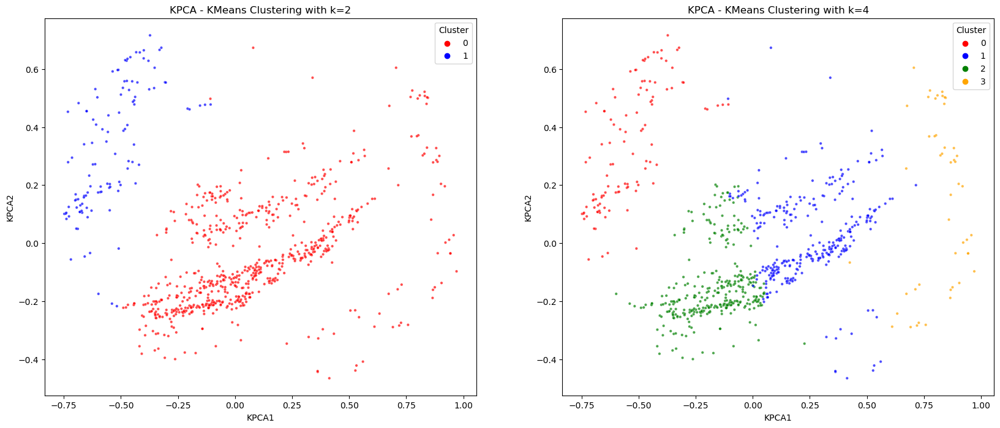

In [224]:
from sklearn.decomposition import KernelPCA

kpca = KernelPCA(n_components=2, kernel='cosine',
                    gamma=15, random_state=42)

data_kpca_k2 = kpca.fit_transform(prep_data.drop(['Cluster_k4', 'Cluster_k2'], axis=1))
data_kpca_k4 = kpca.fit_transform(prep_data.drop(['Cluster_k4', 'Cluster_k2'], axis=1))

df_kpca_k2 = pd.DataFrame(data=data_kpca_k2, columns=['KPCA1', 'KPCA2'])
df_kpca_k2['Cluster'] = data['Cluster_k2']

df_kpca_k4 = pd.DataFrame(data=data_kpca_k4, columns=['KPCA1', 'KPCA2'])
df_kpca_k4['Cluster'] = data['Cluster_k4']

fig, ax = plt.subplots(1, 2, figsize=(20, 8))

sns.scatterplot(x='KPCA1', y='KPCA2', hue='Cluster', palette=colors, data=df_kpca_k2, s=10, ax=ax[0], alpha=0.7)
ax[0].set_title('KPCA - KMeans Clustering with k=2')

sns.scatterplot(x='KPCA1', y='KPCA2', hue='Cluster', palette=colors, data=df_kpca_k4, s=10, ax=ax[1], alpha=0.7)
ax[1].set_title('KPCA - KMeans Clustering with k=4')

<h1> Multidimensional Scaling (MDS) </h1>

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/manifold/_mds.py:298: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/manifold/_mds.py:298: FutureWarning:

The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.



Text(0.5, 1.0, 'MDS - KMeans Clustering with k=4')

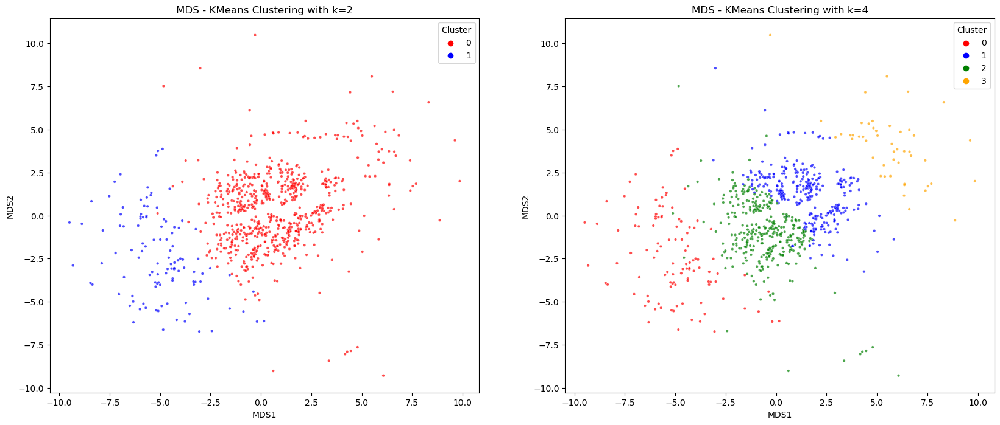

In [225]:
from sklearn.manifold import MDS

mds = MDS(n_components=2, metric=True, random_state=42, dissimilarity='euclidean', n_init=5, max_iter=100, verbose=0, eps=0.001)

data_mds_k2 = mds.fit_transform(prep_data.drop(['Cluster_k4', 'Cluster_k2'], axis=1))
data_mds_k4 = mds.fit_transform(prep_data.drop(['Cluster_k4', 'Cluster_k2'], axis=1))

df_mds_k2 = pd.DataFrame(data=data_mds_k2, columns=['MDS1', 'MDS2'])
df_mds_k2['Cluster'] = data['Cluster_k2']

df_mds_k4 = pd.DataFrame(data=data_mds_k4, columns=['MDS1', 'MDS2'])
df_mds_k4['Cluster'] = data['Cluster_k4']

fig, ax = plt.subplots(1, 2, figsize=(20, 8))

sns.scatterplot(x='MDS1', y='MDS2', hue='Cluster', palette=colors, data=df_mds_k2, s=10, ax=ax[0], alpha=0.7)
ax[0].set_title('MDS - KMeans Clustering with k=2')

sns.scatterplot(x='MDS1', y='MDS2', hue='Cluster', palette=colors, data=df_mds_k4, s=10, ax=ax[1], alpha=0.7)
ax[1].set_title('MDS - KMeans Clustering with k=4')

<h1> UMAP </h1>

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



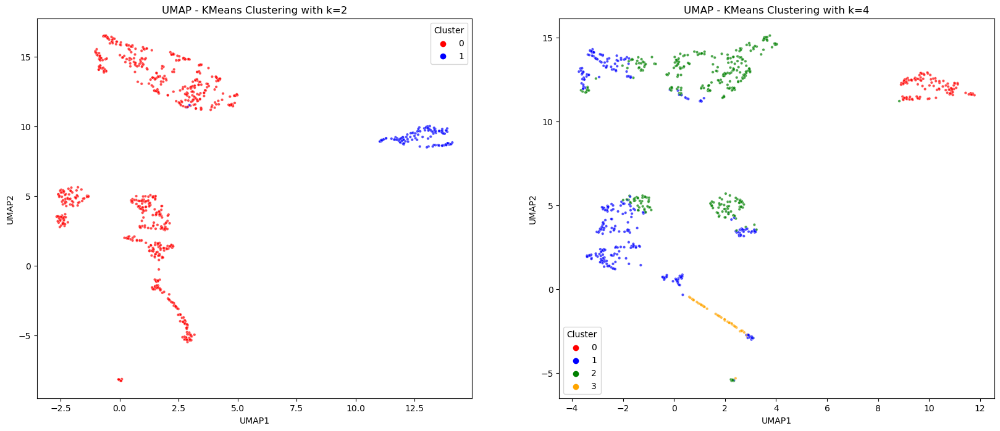

In [226]:
import umap

umap4 = umap.UMAP(n_components=2, n_neighbors=30, min_dist=0.8, random_state=42, n_epochs=500)

data_umap_k4 = umap4.fit_transform(prep_data.drop(['Cluster_k4', 'Cluster_k8'], axis=1))

df_umap_k4 = pd.DataFrame(data=data_umap_k4, columns=['UMAP1', 'UMAP2'])
df_umap_k4['Cluster'] = data['Cluster_k4']

fig, ax = plt.subplots(1, 2, figsize=(20, 8))

sns.scatterplot(x='UMAP1', y='UMAP2', hue='Cluster', palette=colors, data=df_umap_k4, s=10, ax=ax[0], alpha=0.7)
ax[0].set_title('UMAP - KMeans Clustering with k=4')

##################################################################################################
umap8 = umap.UMAP(n_components=2, n_neighbors=80, min_dist=0.2, random_state=42, n_epochs=500)

data_umap_k8 = umap8.fit_transform(prep_data.drop(['Cluster_k4', 'Cluster_k8'], axis=1))

df_umap_k8 = pd.DataFrame(data=data_umap_k8, columns=['UMAP1', 'UMAP2'])
df_umap_k8['Cluster'] = data['Cluster_k8']

sns.scatterplot(x='UMAP1', y='UMAP2', hue='Cluster', palette=colors, data=df_umap_k8, s=10, ax=ax[1], alpha=0.7)
ax[1].set_title('UMAP - KMeans Clustering with k=8')

plt.show()


<h1> Isomap </h1>

Text(0.5, 1.0, 'Isomap - KMeans Clustering with k=4')

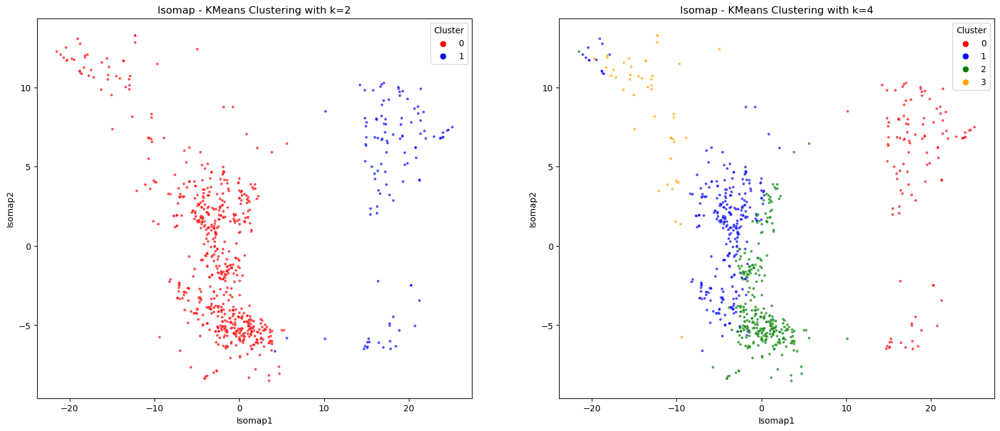

In [227]:
from sklearn.manifold import Isomap

isomap = Isomap(n_components=2, n_neighbors=10, n_jobs=-1, eigen_solver='auto', tol=0, max_iter=None, path_method='auto', neighbors_algorithm='auto')

data_isomap_k2 = isomap.fit_transform(prep_data.drop(['Cluster_k4', 'Cluster_k2'], axis=1))
data_isomap_k4 = isomap.fit_transform(prep_data.drop(['Cluster_k4', 'Cluster_k2'], axis=1))

df_isomap_k2 = pd.DataFrame(data=data_isomap_k2, columns=['Isomap1', 'Isomap2'])
df_isomap_k2['Cluster'] = data['Cluster_k2']

df_isomap_k4 = pd.DataFrame(data=data_isomap_k4, columns=['Isomap1', 'Isomap2'])
df_isomap_k4['Cluster'] = data['Cluster_k4']

fig, ax = plt.subplots(1, 2, figsize=(20, 8))

sns.scatterplot(x='Isomap1', y='Isomap2', hue='Cluster', palette=colors, data=df_isomap_k2, s=10, ax=ax[0], alpha=0.7)
ax[0].set_title('Isomap - KMeans Clustering with k=2')
sns.scatterplot(x='Isomap1', y='Isomap2', hue='Cluster', palette=colors, data=df_isomap_k4, s=10, ax=ax[1], alpha=0.7)
ax[1].set_title('Isomap - KMeans Clustering with k=4')

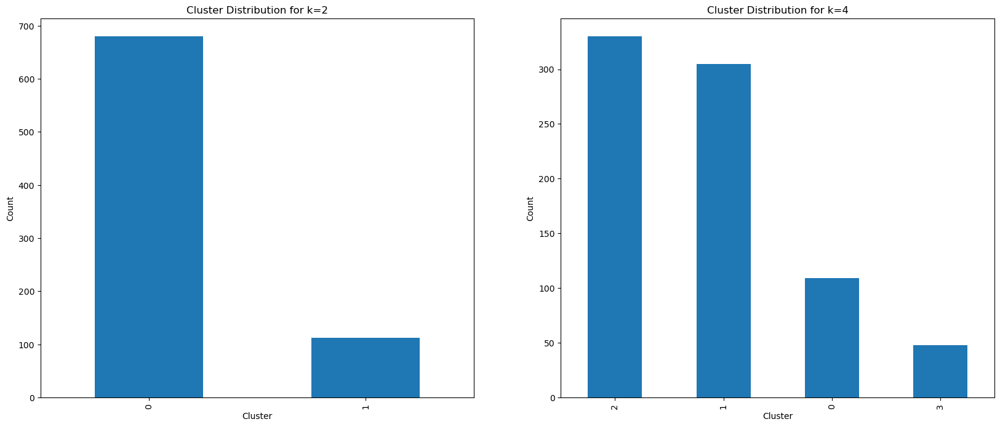

In [228]:
fig, ax = plt.subplots(1, 2, figsize=(20, 8))

data['Cluster_k2'].value_counts().plot(kind='bar', ax=ax[0])
ax[0].set_title('Cluster Distribution for k=2')
ax[0].set_xlabel('Cluster')
ax[0].set_ylabel('Count')

data['Cluster_k4'].value_counts().plot(kind='bar', ax=ax[1])
ax[1].set_title('Cluster Distribution for k=4')
ax[1].set_xlabel('Cluster')
ax[1].set_ylabel('Count')

plt.show()

### Exploration of Clusters (k=2)

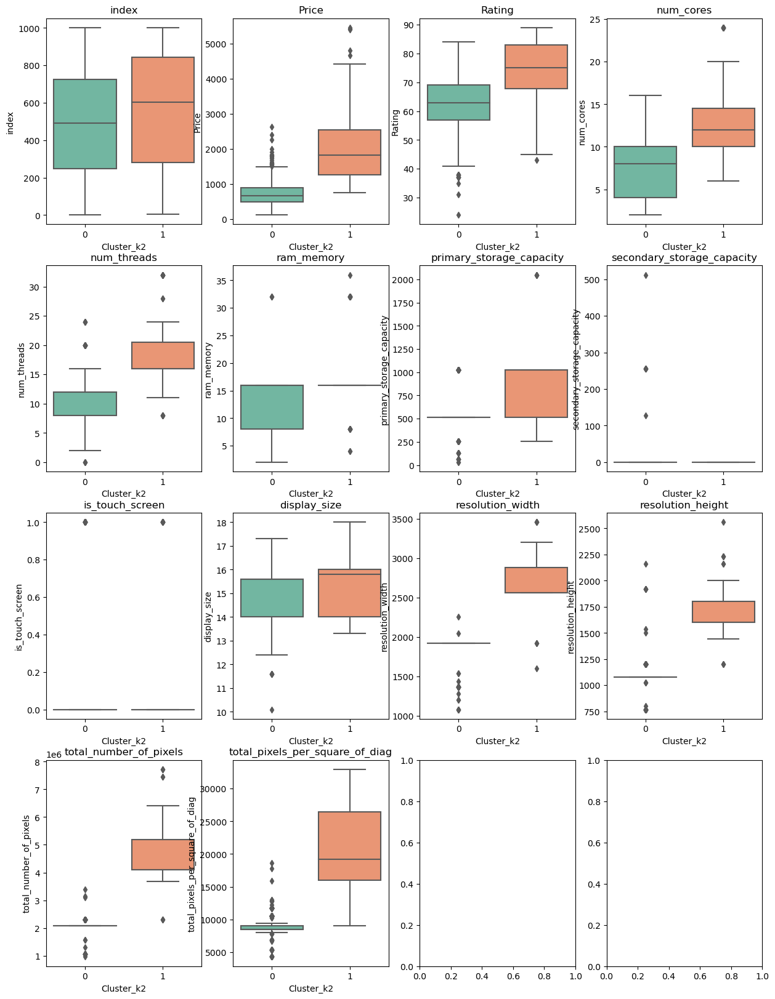

In [229]:
fig, axes = plt.subplots(4, 4, figsize=(15, 4 * 5))

axes = axes.flatten()

i=0
for column in data.columns:
    if column != 'Cluster_k2' and (type(data[column][0]) == np.float64 or type(data[column][0]) == np.int64):
        sns.boxplot(x='Cluster_k2', y=column, data=data, ax = axes[i], palette="Set2")
        axes[i].set_title(column)
        i+=1

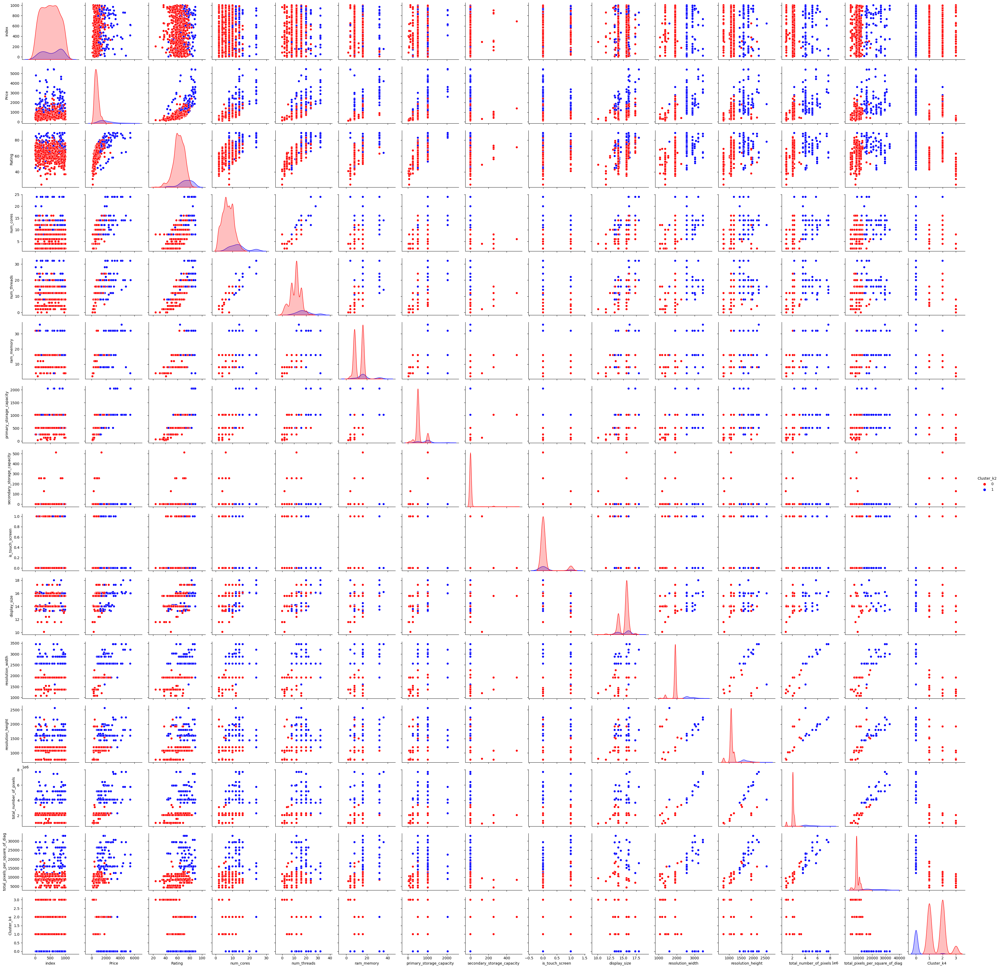

In [230]:
sns.pairplot(data, hue='Cluster_k2', palette=colors)

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/2720505331.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/2720505331.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/2720505331.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/2720505331.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/2720505331.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/2720505331.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd8

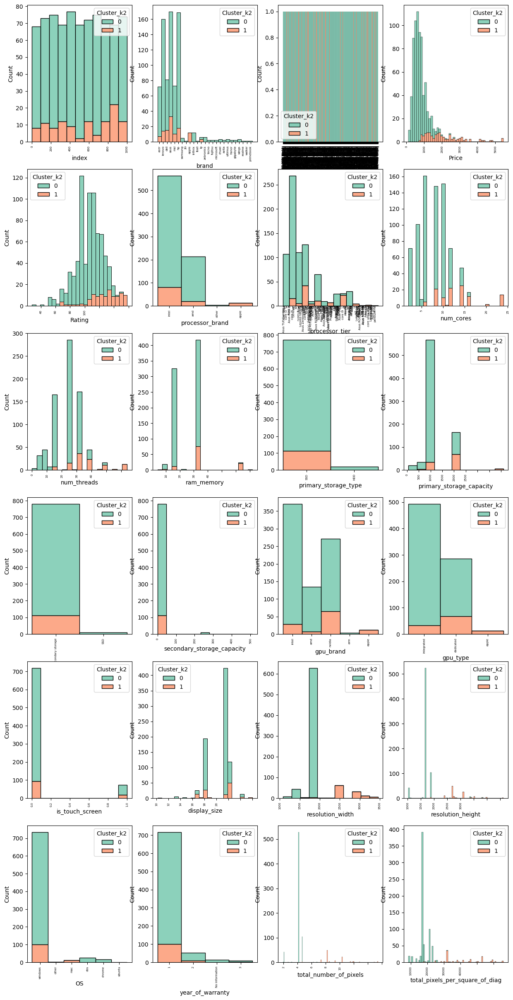

In [231]:
fig, axes = plt.subplots(6, 4, figsize=(15, 6 * 5))

axes = axes.flatten()

i=0

for i, column in enumerate(data.columns):
    if column != 'Cluster_k2' and column != 'Cluster_k4':
        sns.histplot(data=data, x=column, hue="Cluster_k2", multiple="stack", ax=axes[i], palette='Set2')
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
        axes[i].tick_params(axis='x', labelsize=5)
        axes[i].set_xlabel(column)
        i+=1

In [232]:
import plotly.express as px

fig = px.histogram(data, x='brand', color='Cluster_k2')
fig.show()

### Exploration of Clusters (k=4)

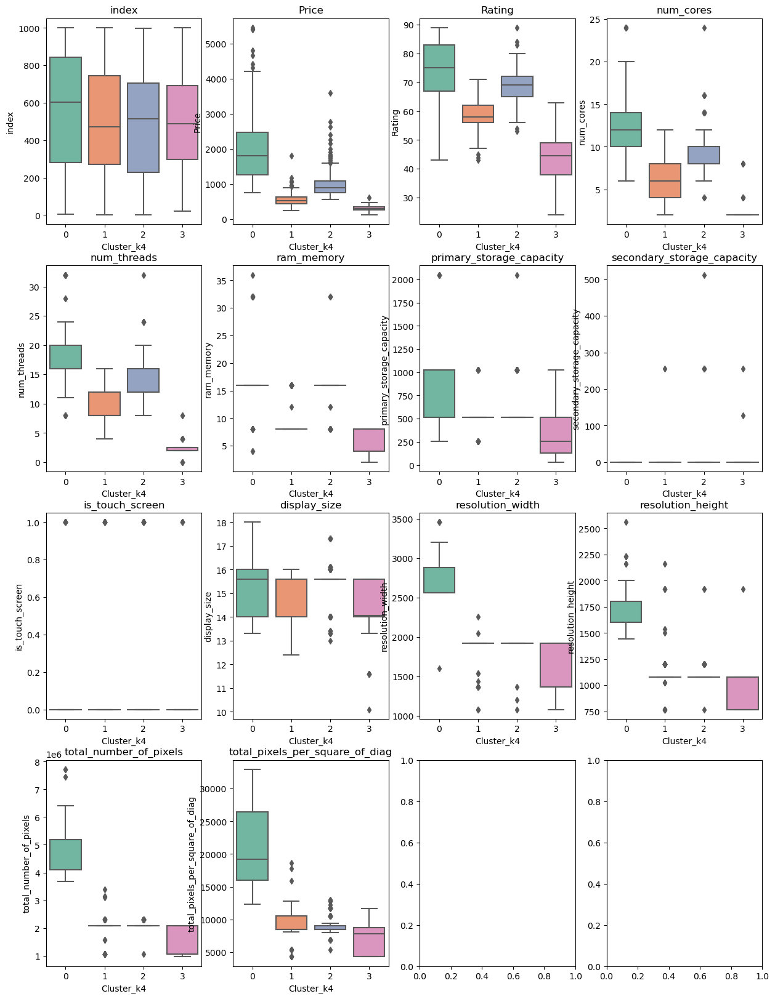

In [233]:
fig, axes = plt.subplots(4, 4, figsize=(15, 4 * 5))

axes = axes.flatten()

i=0
for column in data.columns:
    if column != 'Cluster_k4' and (type(data[column][0]) == np.float64 or type(data[column][0]) == np.int64):
        sns.boxplot(x='Cluster_k4', y=column, data=data, ax = axes[i], palette="Set2")
        axes[i].set_title(column)
        i+=1

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/2092771039.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/2092771039.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/2092771039.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/2092771039.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/2092771039.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_61086/2092771039.py:10: UserWarning:

FixedFormatter should only be used together with FixedLocator

/var/folders/y9/p941jysn0ddb8zkx38rpntd8

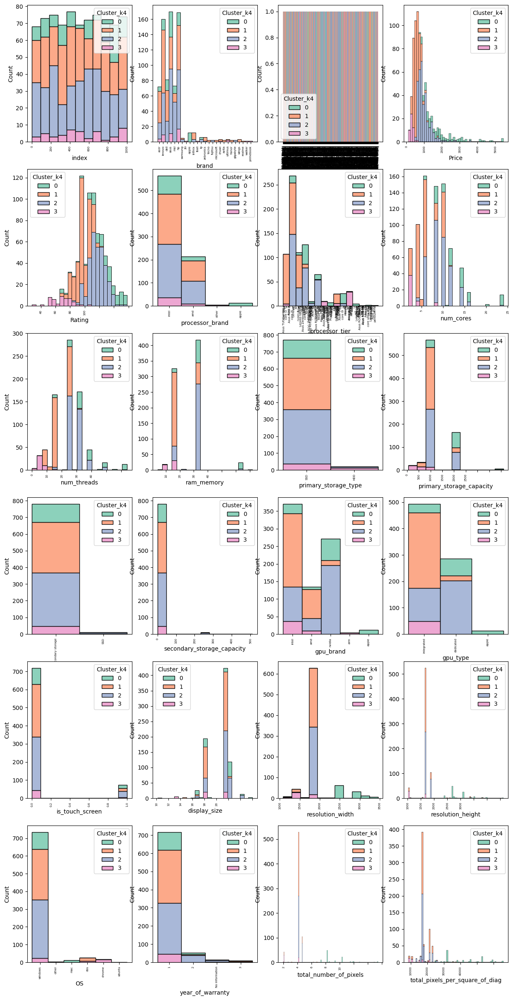

In [234]:
fig, axes = plt.subplots(6, 4, figsize=(15, 6 * 5))

axes = axes.flatten()

i=0

for i, column in enumerate(data.columns):
    if column != 'Cluster_k4' and column != 'Cluster_k2':
        sns.histplot(data=data, x=column, hue="Cluster_k4", multiple="stack", ax=axes[i], palette='Set2')
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
        axes[i].tick_params(axis='x', labelsize=5)
        axes[i].set_xlabel(column)
        i+=1

In [235]:
import plotly.express as px

fig = px.histogram(data, x='brand', color='Cluster_k4')
fig.show()